# Analisis AIRBNB Listings Bangkok (2012-2022)

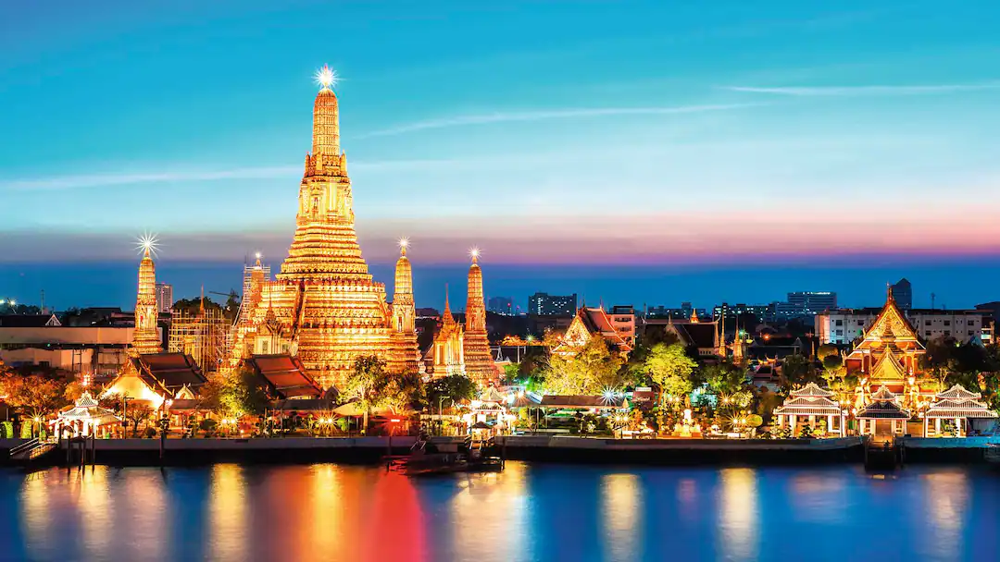

## Latar Belakang

Airbnb telah menjadi salah satu platform utama untuk pemesanan akomodasi bagi wisatawan yang berkunjung ke Bangkok, Thailand. Seiring dengan pertumbuhan industri pariwisata di kota ini, pertumbuhan pasar Airbnb juga mengalami peningkatan yang signifikan. Dengan jumlah properti yang terus bertambah, baik dalam berbagai tipe, harga, lokasi, serta jumlah host yang semakin banyak, sehingga penting untuk memahami perubahan dan pergerakan pasar Airbnb di Bangkok secara lebih mendalam.

Analisa data Airbnb sangat diperlukan untuk memaksimalkan keputusan bisnis yang akan mereka ambil berdasarkan data historical yang telah dimiliki. **Pertama,** perusahaan perlu memahami apakah ada hubungan yang signifikan antara atribut numerik tertentu dgan harga sewa, terutama ketika dibedakan berdasarkan tipe kamar. Pengetahuan ini akan membantu untuk melihat dan memahami faktor-faktor yang berpengaruh terhadap rata-rata harga tiap tipe kamar, serta pengambilan keputusan yang lebih tepat dalam menetapkan harga properti sesuai dengan karakteristik dan fasilitas yang ditawarkan. **Selanjutnya,** pentingnya pemahaman mendalam tentang distribusi tipe kamar di berbagai wilayah geografis di Bangkok, untuk mengidentifikasi potensi peluang pasar yang ada dan mengoptimalkan penawaran agar sesuai dengan preferensi pengguna di tiap zona. **Ketiga,** perusahaan perlu mengevaluasi dampak ke-aktifan listing di platform Airbnb, yang dapat berpengaruh terhadap kinerja bisnis, terutama dalam konteks frekuensi ulasan dalam 12 bulan terakhir (number_of_reviews_ltm). Analisis ini akan membantu dalam memahami bagaimana tingkat keterlibatan dan feedback dari pengguna berkontribusi terhadap kinerja dan ke-aktifan suatu properti. **Terakhir,** distribusi popularitas properti Airbnb di Bangkok, yang tercermin dalam jumlah ulasan 12 bulan terakhir berdasarkan wilayah geografisnya, menjadi fokus penting untuk memahami preferensi pengguna dan potensi pertumbuhan di berbagai bagian kota. Dengan memahami dan menyelesaikan permasalahan ini, perusahaan dapat mengoptimalkan strategi mereka untuk melihat potensi dari suatu wilayah, rencana ekspansi pada suatu wilayah, maupun teknik marketing pada suatu wilayah guna meningkatkan kinerja bisnis mereka di pasar yang kompetitif.

## Stakeholder: Tim Airbnb

## Permasalahan Bisnis
1. **Apa saja faktor/variabel yang mempengaruhi rata-rata harga berdasarkan tipe kamar?**
2. **Bagaimana distribusi tipe kamar Airbnb di berbagai zona geografis di Bangkok?**
3. **Bagaimana tingkat ke-aktifan listing di Airbnb berdasarkan frekuensi ulasan terbaru dan dampaknya?**
4. **Bagaimana distribusi popularitas properti Airbnb di Bangkok berdasarkan jumlah ulasan 12 bulan terakhir (number_of_reviews_ltm) dan wilayah geografisnya?**

## Tujuan Analisis
1. Mengidentifikasi faktor/variabel yang memiliki korelasi signifikan dengan harga sewa berdasarkan tipe kamar. 
2. Membantu host atau investor untuk menyesuaikan penawaran mereka berdasarkan tipe kamar sesuai dengan permintaan dan preferensi pasar, serta mengidentifikasi area-area yang memiliki potensi pertumbuhan.
3. Memahami seberapa besar pengaruh frekuensi ulasan terbaru terhadap kinerja dan ke-aktifan listing di Airbnb. 
4. Membantu host atau investor mengetahui pengaruh popularitas untuk menargetkan investasi dan strategi pemasaran mereka sehingga dapat memaksimalkan visibilitas dan keuntungan.

## Penjelasan Kolom

- **id:** Pengenal unik Airbnb pada daftar.
- **name:** Deskripsi yang diberikan oleh pemilik mengenai property yang disewakan.
- **host_id:** Kode unik Airbnb terhadap host/pemilik property.
- **host_name:** Nama tuan rumah atau pemilik yang menyewakan property.
- **neighbourhood:** Nama daerah atau kecamatan letak Airbnb pada daftar.
- **latitude:** Letak latitude koordinat spesifik dari properti pada daftar.
- **longitude:** Letak longitude koordinat spesifik dari properti pada daftar.
- **room_type:** Tipe kamar yang tersedia pada daftar, terbagi atas 4 tipe yaitu:
  * Entire home/apt        
  * Private room 
  * Hotel room             
  * Shared room
- **price:** Harga sewa harian dalam mata uang lokal.
- **minimum_nights:** Jumlah minimum lama menginap masing-masing properti.
- **number_of_reviews:** Jumlah ulasan yang dimiliki masing-masing properti.
- **last_review:** Tanggal ulasan terakhir atau terbaru.
- **reviews_per_month:** Rata-rata jumlah review masing-masing properti tiap bulannya.
- **calculated_host_listing_count:** Jumlah properti yang dimiliki tiap host_id atau host_name.
- **availability_365:** Ketersediaan properti selama 1 tahun kalender (dalam bentuk hari).
- **numbers_of_reviews_ltm:** Jumlah ulasan yang dimiliki masing-masing properti, dalam kurun 12 bulan terakhir.

## Kolom baru yang dibuat untuk keperluan analisis:
- **geographic_group:** kolom tambahan sebagai bentuk yang lebih spesifik dari kolom neighbourhood (neighbourhood dikelompokkan menjadi East, West, North, South, dan Central)
- **popularity:** kolom tambahan hasil dari penggolongan geographic_group. Melambangkan tingkat popularitas tiap geographic_group

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

# Read Dataset

In [99]:
df = pd.read_csv('Airbnb Listings Bangkok.csv')
df

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.759830,100.541340,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.668180,100.616740,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.752320,100.624020,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.788230,100.572560,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.768720,100.633380,Private room,1905,1,0,NaN,NaN,3,365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15849,15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15850,15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaN,NaN,14,365,0
15851,15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaN,NaN,14,365,0
15852,15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaN,NaN,14,365,0


# Data Preprocessing

### Melakukan cek pada dataset, dengan melihat jumlah indeks & baris, jumlah kolom, jumlah data yang tidak null dan null, dan tipe data tiap kolomnya.

In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15854 entries, 0 to 15853
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Unnamed: 0                      15854 non-null  int64  
 1   id                              15854 non-null  int64  
 2   name                            15846 non-null  object 
 3   host_id                         15854 non-null  int64  
 4   host_name                       15853 non-null  object 
 5   neighbourhood                   15854 non-null  object 
 6   latitude                        15854 non-null  float64
 7   longitude                       15854 non-null  float64
 8   room_type                       15854 non-null  object 
 9   price                           15854 non-null  int64  
 10  minimum_nights                  15854 non-null  int64  
 11  number_of_reviews               15854 non-null  int64  
 12  last_review                     

### Melihat jumlah data yang memiliki nilai null pada setiap kolomnya

In [101]:
df.isna().sum()

Unnamed: 0                           0
id                                   0
name                                 8
host_id                              0
host_name                            1
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5790
reviews_per_month                 5790
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

### Melakukan drop pada kolom indeks duplikat 'Unnamed: 0', kolom host_id dan host_name yang mengandung nilai null

In [102]:
df.drop(columns='Unnamed: 0', inplace=True)
df.dropna(subset=['name', 'host_name'], inplace = True)

### Pengecekan setelah melakukan drop null

In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15845 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              15845 non-null  int64  
 1   name                            15845 non-null  object 
 2   host_id                         15845 non-null  int64  
 3   host_name                       15845 non-null  object 
 4   neighbourhood                   15845 non-null  object 
 5   latitude                        15845 non-null  float64
 6   longitude                       15845 non-null  float64
 7   room_type                       15845 non-null  object 
 8   price                           15845 non-null  int64  
 9   minimum_nights                  15845 non-null  int64  
 10  number_of_reviews               15845 non-null  int64  
 11  last_review                     10061 non-null  object 
 12  reviews_per_month               10061

### Mengubah tipe data pada kolom last_review, yang sebelumnya berupa string/object menjadi datetime

In [104]:
df['last_review'] = pd.to_datetime(df['last_review'])
df.sample(5)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
9735,40749421,Condo near BTS Ekamai,97471668,Kulwadee,Khlong Toei,13.71159,100.58349,Private room,535,30,0,NaT,NaN,2,149,0
6429,31024437,Baan Seree –– unit #3,210140238,Joseph,Sathon,13.71840,100.52615,Entire home/apt,1212,3,16,2021-09-10,0.33,4,0,0
4885,24072827,"Prime Location and City Skyline Views, Ekamai BTS",48174623,Nuttakorn,Khlong Toei,13.71196,100.58344,Private room,800,3,1,2021-04-04,0.05,1,358,0
6466,31025938,"26 m2, bathtub, 3pax, Airport Link/BTS Phayathai",231387551,Hotel Tranz,Ratchathewi,13.75550,100.53355,Private room,3900,1,3,2022-07-12,0.07,7,175,1
2646,15573203,"1 bedroom ,1 living room,1 kitchen",100312802,Kamonwan,Bang Na,13.66338,100.61058,Private room,1200,1,0,NaT,NaN,3,365,0


### Melihat apakah ada baris yang duplikat

In [105]:
duplicate_rows = df[df.duplicated()]
pd.DataFrame(duplicate_rows)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm


###  Mengambil nilai unik dari kolom 'name' untuk baris-baris yang merupakan duplikat dalam DataFrame

In [106]:
df[df.duplicated()==1]['name'].unique()

array([], dtype=object)

### Memeriksa apakah nilai dalam kolom 'name' ada di dalam daftar nilai yang diberikan

In [107]:
df[df['name'].isin(['NA BANGLAMPOO GUEST HOUSE', 'small1',
       'Sathon Luxury 2 br/China Town/Icon Siam',
       'Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9',
       'Family Room for 4 People'])]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
5890,28831409,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.762790,100.497900,Private room,1400,1,0,NaT,NaN,9,361,0
5892,28832370,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.761620,100.497680,Private room,750,1,16,2020-02-18,0.32,9,360,0
5976,28907857,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.762790,100.497900,Private room,1400,1,0,NaT,NaN,9,361,0
6728,31678264,small1,97598307,Soo,Don Mueang,13.915070,100.585840,Shared room,350,1,0,NaT,NaN,4,180,0
8789,37953702,small1,97598307,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,NaT,NaN,4,180,0
8790,37954129,small1,97598307,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,NaT,NaN,4,180,0
10826,43284894,Family Room for 4 People,340188343,Rachan,Vadhana,13.740603,100.556081,Private room,2720,1,0,NaT,NaN,14,360,0
15183,765632824291529126,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaT,NaN,44,340,0
15186,765691389894680033,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaT,NaN,44,340,0
15187,765693830342277946,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,1,2022-12-11,1.00,44,340,1


### Melakukan drop pada baris berdasarkan kesamaan kolom host_id, latitude, longitude, price

In [108]:
df = df.drop_duplicates(subset=['host_id', 'latitude', 'longitude', 'price'])
pd.DataFrame(df)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.759830,100.541340,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.668180,100.616740,Private room,1316,1,0,NaT,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.752320,100.624020,Private room,800,60,0,NaT,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.788230,100.572560,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.768720,100.633380,Private room,1905,1,0,NaT,NaN,3,365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaT,NaN,1,362,0
15850,790474503157243541,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.753052,100.538738,Private room,1429,1,0,NaT,NaN,14,365,0
15851,790475335086864240,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.753169,100.538700,Private room,1214,1,0,NaT,NaN,14,365,0
15852,790475546213717328,Euro LuxuryHotel PratunamMKt TwinBedNrShopingArea,491526222,Phakhamon,Ratchathewi,13.754789,100.538757,Private room,1214,1,0,NaT,NaN,14,365,0


### Melihat jumlah nilai unique pada setiap kolomnya

In [109]:
df.nunique()

id                                15674
name                              14667
host_id                            6651
host_name                          5306
neighbourhood                        50
latitude                           9602
longitude                         10222
room_type                             4
price                              3040
minimum_nights                       86
number_of_reviews                   296
last_review                        1659
reviews_per_month                   512
calculated_host_listings_count       50
availability_365                    366
number_of_reviews_ltm                84
dtype: int64

## Melihat outlier pada data

In [110]:
# Menghitung kuartil pertama (Q1)
Q1 = df['price'].quantile(0.25)

# Menghitung kuartil ketiga (Q3)
Q3 = df['price'].quantile(0.75)

# Menghitung IQR (interquartile range)
IQR = Q3 - Q1

# Menentukan batas atas (upper fence) dan batas bawah (lower fence)
upper_fence = Q3 + 1.5 * IQR
lower_fence = Q1 - 1.5 * IQR

# Mengidentifikasi outlier
outliers = df[(df['price'] < lower_fence) | (df['price'] > upper_fence)]

# Mengurutkan outlier berdasarkan harga secara descending
outliers_sorted = outliers.sort_values(by='price', ascending=False)

# Menampilkan jumlah dan persentase outlier
outlier_count = outliers.shape[0]
total_count = df.shape[0]
outlier_percentage = (outlier_count / total_count) * 100
print("Jumlah outlier:", outlier_count)
print("Persentase outlier: {:.2f}%".format(outlier_percentage))
print("Data yang tergolong sebagai outlier:")
pd.DataFrame(outliers_sorted)

Jumlah outlier: 1377
Persentase outlier: 8.79%
Data yang tergolong sebagai outlier:


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
12868,635676064543597376,New 1 bedroom apartment BTS MRT Asoke,12464705,Lucio,Vadhana,13.742186,100.560394,Entire home/apt,1100000,14,0,NaT,NaN,1,365,0
12300,562972065309061724,3B中文No Guest Service Fee@Nana Asok/Soi11 Night...,131427125,Jj,Vadhana,13.746660,100.559100,Entire home/apt,1014758,30,2,2022-09-17,0.32,10,75,2
1779,11579635,"2 Bedroom,wifi,5mMRT&Shopping Mall",30803267,Yasmine,Huai Khwang,13.754710,100.565980,Entire home/apt,1000000,100,53,2018-02-20,0.64,4,249,0
9345,39858231,1BR cozy condo close to ONNUT BTS.,210559448,Cora,Khlong Toei,13.704960,100.591510,Entire home/apt,1000000,25,2,2020-02-23,0.05,6,88,0
4620,23740993,"Modern&Luxury apartment,5min to MRT,freeWifi",30803267,Yasmine,Huai Khwang,13.760650,100.568980,Entire home/apt,1000000,1,12,2020-03-24,0.22,4,336,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7270,33102996,10 Person House @ platinum mall Central World BTS,595560,Edmond,Ratchathewi,13.760050,100.542100,Entire home/apt,4744,1,42,2022-11-21,0.92,3,332,5
1121,8654051,Bangkok Silom Private Gathering Place # Air3nity,13282564,Inthanom,Bang Rak,13.725300,100.529500,Entire home/apt,4734,1,239,2022-12-12,3.28,6,194,15
11386,46347034,"Way of Riverside, Way of Ordinary Life",149900593,Theatre Residence,Bangkok Noi,13.753410,100.487350,Private room,4727,1,0,NaT,NaN,4,362,0
5152,25493646,Riverfront Residence Bangkok River view (2BR),100104168,Riverfront,Yan na wa,13.673040,100.544660,Private room,4726,1,0,NaT,NaN,2,363,0


## Visualisasi outliers dengan boxplot

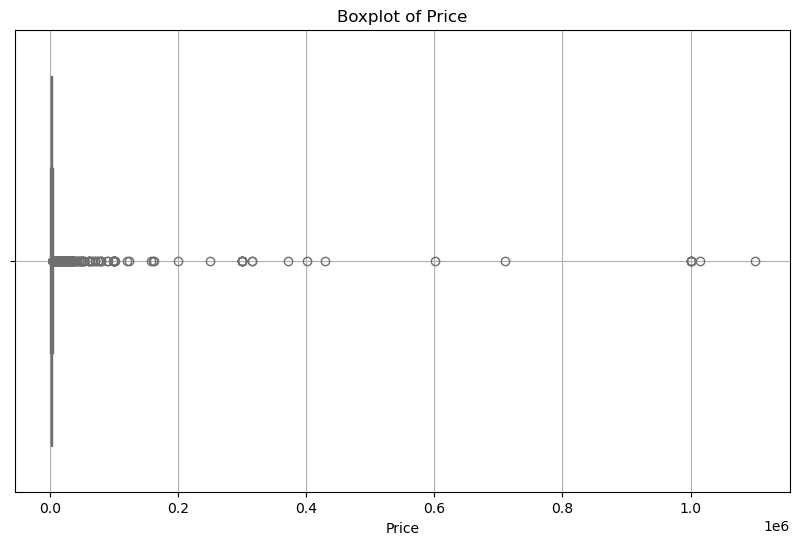

In [111]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='price', color='skyblue')
plt.title('Boxplot of Price')
plt.xlabel('Price')
plt.grid(True)
plt.show()

## Melihat nilai upper_fence sebagai batas outlier, dan melihat persentase nilai outliernya (nilai price yang melebihi upper_fence)

In [112]:
print(upper_fence)
# Menghitung jumlah total baris
total_rows = len(df)

# Menghitung jumlah baris yang memenuhi kondisi tertentu
condition_rows = len(df[df['price'] > 4722.5])

# Menghitung persentase
percentage_condition = (condition_rows / total_rows) * 100

print("Persentase baris dengan harga di atas 4722.5:", percentage_condition, "%")

4722.5
Persentase baris dengan harga di atas 4722.5: 8.785249457700651 %


## Melakukan drop outlier pada kolom price

In [113]:
# Mengidentifikasi indeks baris yang memenuhi kondisi outlier
outlier_indices = df[df['price'] > 4722.5].index

# Menghapus baris dengan indeks outlier
df.drop(outlier_indices, inplace=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14297 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              14297 non-null  int64         
 1   name                            14297 non-null  object        
 2   host_id                         14297 non-null  int64         
 3   host_name                       14297 non-null  object        
 4   neighbourhood                   14297 non-null  object        
 5   latitude                        14297 non-null  float64       
 6   longitude                       14297 non-null  float64       
 7   room_type                       14297 non-null  object        
 8   price                           14297 non-null  int64         
 9   minimum_nights                  14297 non-null  int64         
 10  number_of_reviews               14297 non-null  int64         
 11  last_re

C:\Users\grega\AppData\Local\Temp\ipykernel_34896\505301186.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(outlier_indices, inplace=True)


In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14297 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              14297 non-null  int64         
 1   name                            14297 non-null  object        
 2   host_id                         14297 non-null  int64         
 3   host_name                       14297 non-null  object        
 4   neighbourhood                   14297 non-null  object        
 5   latitude                        14297 non-null  float64       
 6   longitude                       14297 non-null  float64       
 7   room_type                       14297 non-null  object        
 8   price                           14297 non-null  int64         
 9   minimum_nights                  14297 non-null  int64         
 10  number_of_reviews               14297 non-null  int64         
 11  last_re

In [115]:
df.isna().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5101
reviews_per_month                 5101
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

## Mengganti data kosong pada kolom last_review dan reviews_per_month dengan 0

In [116]:
# Mengganti NaN atau data kosong dengan 0 pada kolom 'last_review' dan 'reviews_per_month'
df['last_review'] = df['last_review'].fillna(0)
df['reviews_per_month'] = df['reviews_per_month'].fillna(0)

C:\Users\grega\AppData\Local\Temp\ipykernel_34896\1287050878.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['last_review'] = df['last_review'].fillna(0)
C:\Users\grega\AppData\Local\Temp\ipykernel_34896\1287050878.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['reviews_per_month'] = df['reviews_per_month'].fillna(0)


## Merubah kembali tipe data kolom last_review menjadi datetime

In [117]:
df['last_review'] = pd.to_datetime(df['last_review'], errors = 'coerce')
df.sample(5)

C:\Users\grega\AppData\Local\Temp\ipykernel_34896\2776786978.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['last_review'] = pd.to_datetime(df['last_review'], errors = 'coerce')


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15449,773663237973657258,SALE! 2br for 4 ppl!Surasak BTS/Pool&GYM/WIFI,485536928,Lucas,Sathon,13.71173,100.51972,Entire home/apt,2221,1,2,2022-12-22,2.00,4,173,2
9359,39518464,705★Nara Suite Residence★2KingBed+Kitchen会说中文,132473239,Amb Ville,Yan na wa,13.69942,100.53326,Entire home/apt,1390,1,35,2022-07-15,0.91,25,352,9
2954,17179924,Cozy room and peaceful,115166861,Pavinee,Phra Khanong,13.69441,100.62147,Private room,1150,2,0,1970-01-01,0.00,1,89,0
10859,43312186,Double room 2 person-Taladnoi Painthouse,324456745,Saowaros,Samphanthawong,13.73347,100.51267,Private room,1200,1,0,1970-01-01,0.00,5,365,0
8602,37742786,The most beautiful Sky pool俯瞰曼谷,272358230,Charles,Bang Phlat,13.80045,100.50621,Entire home/apt,800,60,1,2020-01-27,0.03,28,364,0


## Data yang kosong sebelumnya berubah menjadi data datetime baru (1970-01-01), oleh karena itu dilihat jumlah dan persentasenya untuk memutuskan apakah kolom tersebut akan di drop atau tidak

In [118]:
# Hitung jumlah baris yang terkait dengan tahun 1970
count_1970 = df[df['last_review'].dt.year == 1970].shape[0]

print("Jumlah data pada tahun 1970:", count_1970)

Jumlah data pada tahun 1970: 5101


In [119]:
# Hitung total jumlah baris dalam dataset
total_rows = df.shape[0]

# Hitung persentase data pada tahun 1970
percentage_1970 = (count_1970 / total_rows) * 100

print("Persentase data pada tahun 1970:", percentage_1970, "%")

Persentase data pada tahun 1970: 35.67881373714765 %


## Mengganti (1970-01-01) dengan 0

In [120]:
# Seleksi baris yang memiliki nilai 'last_review' tahun 1970
df['last_review']=df['last_review'].replace('1970-01-01', '0')
df.head()

C:\Users\grega\AppData\Local\Temp\ipykernel_34896\1698398289.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['last_review']=df['last_review'].replace('1970-01-01', '0')


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06 00:00:00,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,0,0.00,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,0,0.00,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01 00:00:00,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,0,0.00,3,365,0


## Merubah kembali tipe data kolom last_review menjadi datetime

In [121]:
df['last_review'] = pd.to_datetime(df['last_review'], errors = 'coerce')
df.sample(5)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14297 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              14297 non-null  int64         
 1   name                            14297 non-null  object        
 2   host_id                         14297 non-null  int64         
 3   host_name                       14297 non-null  object        
 4   neighbourhood                   14297 non-null  object        
 5   latitude                        14297 non-null  float64       
 6   longitude                       14297 non-null  float64       
 7   room_type                       14297 non-null  object        
 8   price                           14297 non-null  int64         
 9   minimum_nights                  14297 non-null  int64         
 10  number_of_reviews               14297 non-null  int64         
 11  last_re

C:\Users\grega\AppData\Local\Temp\ipykernel_34896\459140361.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['last_review'] = pd.to_datetime(df['last_review'], errors = 'coerce')


## Melihat data dan melakukan drop pada kolom price yang nilainya 0

In [122]:
zero_price_data = df[df['price'] == 0]
zero_price_data

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.73815,100.5642,Hotel room,0,1,0,NaT,0.0,1,0,0


In [123]:
# Mengidentifikasi indeks baris yang memenuhi kondisi outlier
drop0_price = df[df['price'] == 0].index

# Menghapus baris dengan indeks outlier
df.drop(drop0_price, inplace=True)

C:\Users\grega\AppData\Local\Temp\ipykernel_34896\3838751823.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(drop0_price, inplace=True)


## Pengecekan Dataset

In [124]:
# Melihat jumlah pada setiap unique host id
df['host_id'].value_counts()

host_id
201677068    212
52161947      96
26736483      75
228535635     62
62257044      54
            ... 
222410392      1
222471467      1
222478836      1
33330697       1
94899359       1
Name: count, Length: 6191, dtype: int64

# Tahap Analisis harga AIRBNB Listings Bangkok

## 1. Apa saja faktor/variabel yang mempengaruhi rata-rata harga berdasarkan tipe kamar? 

In [125]:
# Melihat unique value pada kolom room_type
unique_room_types = df['room_type'].unique()
pd.DataFrame(unique_room_types)

,0
0,Entire home/apt
1,Private room
2,Hotel room
3,Shared room


### Melihat room_type dengan rata-rata kolom numerik

In [128]:
# Menghitung rata-rata harga berdasarkan room_type
average_price_by_room_type = df.groupby('room_type')['price'].mean().round()

# Menghitung jumlah tiap room type
count_by_room_type = df['room_type'].value_counts()

# Menghitung nilai minimum minimum_nights berdasarkan room_type
min_nights_by_room_type = df.groupby('room_type')['minimum_nights'].mean().round()

# Menghitung jumlah number_of_reviews berdasarkan room_type
reviews_by_room_type = df.groupby('room_type')['number_of_reviews'].mean().round()

# Menggabungkan hasil perhitungan rata-rata harga, jumlah tiap room type, minimum_nights, dan number_of_reviews berdasarkan room_type
result_df = pd.DataFrame({'average_price': average_price_by_room_type, 
                          'jumlah_tiap_room type': count_by_room_type,
                          'minimum_nights': min_nights_by_room_type,
                          'number_of_reviews': reviews_by_room_type})
    
# Mengurutkan hasil secara descending berdasarkan rata-rata harga
result_df = result_df.sort_values(by='average_price', ascending=False)

# Menampilkan DataFrame
pd.DataFrame(result_df)

,average_price,jumlah_tiap_room type,minimum_nights,number_of_reviews
room_type,,,,
Entire home/apt,1703.0,8035,21.0,22.0
Hotel room,1694.0,544,2.0,22.0
Private room,1422.0,5231,9.0,9.0
Shared room,649.0,486,4.0,5.0


C:\Users\grega\AppData\Local\Temp\ipykernel_34896\824365856.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0, 0].set_xticklabels(room_type, rotation=45, ha='right')
C:\Users\grega\AppData\Local\Temp\ipykernel_34896\824365856.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0, 1].set_xticklabels(room_type, rotation=45, ha='right')
C:\Users\grega\AppData\Local\Temp\ipykernel_34896\824365856.py:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1, 0].set_xticklabels(room_type, rotation=45, ha='right')
C:\Users\grega\AppData\Local\Temp\ipykernel_34896\824365856.py:33: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1, 1].set_xticklabels(room_type, rotation=45, ha='right')


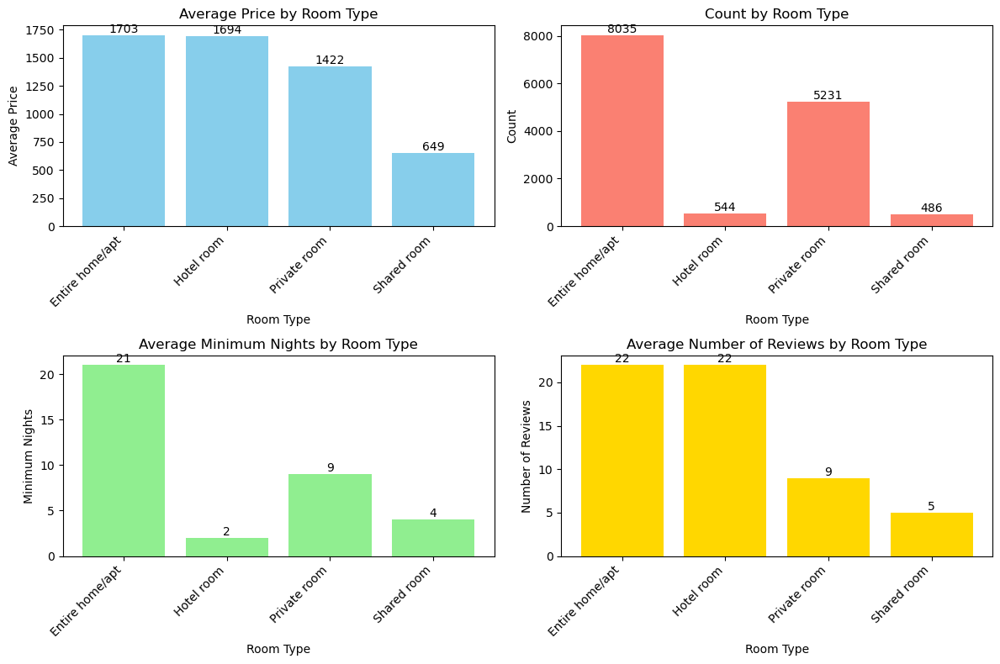

In [131]:
# Data
room_type = result_df.index
average_price = result_df['average_price']
jumlah_room_type = result_df['jumlah_tiap_room type']
minimum_nights = result_df['minimum_nights']
number_of_reviews = result_df['number_of_reviews']

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(12, 8))

# Barplot untuk rata-rata harga
axs[0, 0].bar(room_type, average_price, color='skyblue')
axs[0, 0].set_title('Average Price by Room Type')
axs[0, 0].set_ylabel('Average Price')
axs[0, 0].set_xticklabels(room_type, rotation=45, ha='right')

# Barplot untuk jumlah tiap room type
axs[0, 1].bar(room_type, jumlah_room_type, color='salmon')
axs[0, 1].set_title('Count by Room Type')
axs[0, 1].set_ylabel('Count')
axs[0, 1].set_xticklabels(room_type, rotation=45, ha='right')

# Barplot untuk minimum nights
axs[1, 0].bar(room_type, minimum_nights, color='lightgreen')
axs[1, 0].set_title('Average Minimum Nights by Room Type')
axs[1, 0].set_ylabel('Minimum Nights')
axs[1, 0].set_xticklabels(room_type, rotation=45, ha='right')

# Barplot untuk number of reviews
axs[1, 1].bar(room_type, number_of_reviews, color='gold')
axs[1, 1].set_title('Average Number of Reviews by Room Type')
axs[1, 1].set_ylabel('Number of Reviews')
axs[1, 1].set_xticklabels(room_type, rotation=45, ha='right')

# Tambahkan label room_type pada setiap subplot
for ax in axs.flat:
    ax.set_xlabel('Room Type')

# Tambahkan penjelasan untuk setiap bar
for ax in axs.flat:
    for bar in ax.patches:
        ax.annotate(format(bar.get_height(), '.0f'), 
                    (bar.get_x() + bar.get_width() / 2, 
                     bar.get_height()), 
                    ha='center', va='center', 
                    size=10, xytext=(0, 5), 
                    textcoords='offset points')

plt.tight_layout()
plt.show()

## Insight:
- Tipe kamar "Entire home/apt" memiliki harga sewa rata-rata **tertinggi** di antara semua tipe kamar yang terdaftar di Airbnb di Bangkok. Hal ini menunjukkan bahwa **penyewa cenderung bersedia membayar lebih mahal untuk mendapatkan seluruh rumah/apartemen untuk diri mereka sendiri.**
- Tipe kamar "Shared room" memiliki harga sewa rata-rata **terendah** di antara semua tipe kamar. Hal ini menunjukkan bahwa **penginapan yang bersifat berbagi (shared) dapat menjadi pilihan yang lebih terjangkau bagi pengguna Airbnb.**

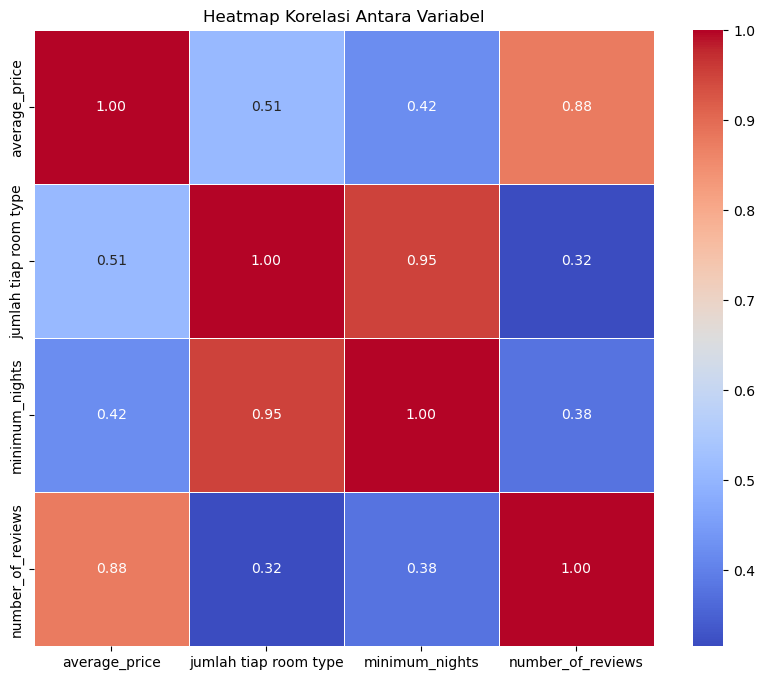

In [31]:
# Menghitung korelasi antar variabel
correlation = result_df.corr()

# Membuat heatmap korelasi
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi Antara Variabel')
plt.show()

## Insight:
- Berdasarkan heatmap, harga rata-rata cenderung lebih tinggi untuk properti dengan jumlah ulasan yang lebih banyak, yang menunjukkan hubungan positif yang kuat antara jumlah ulasan dan harga dengan nilai 0.88. Artinya **reputasi dan feedback pelanggan sangat penting dalam menentukan harga properti Airbnb dan memberikan wawasan berharga bagi pemilik properti untuk menetapkan strategi harga dan promosi.**
- Heatmap juga menunjukan hubungan menengah atau sedang antara jumlah tiap tipe ruangan maupun minimal menginap dengan harga rata-rata, dimana nilai masing-masingnya 0.51 dan 0.42

## 2. Bagaimana distribusi tipe kamar Airbnb di berbagai zona geografis di Bangkok?

In [32]:
# List of districts in Bangkok along with geographical region groups
district_geographic_group = {
    'Bang Sue': 'North Bangkok',
    'Lak Si': 'North Bangkok',
    'Sai Mai': 'North Bangkok',
    'Chatu Chak' : 'North Bangkok',
    'Don Mueang': 'North Bangkok',
    'Bang Khen': 'North Bangkok',
    'Chatuchak': 'North Bangkok',
    'Bang Kapi': 'East Bangkok',
    'Lat Krabang': 'East Bangkok',
    'Wang Thong Lang': 'East Bangkok',
    'Nong Chok': 'East Bangkok',
    'Bueng Kum': 'East Bangkok',
    'Min Buri': 'East Bangkok',
    'Saphan Sung' :'East Bangkok',
    'Khlong Sam Wa': 'East Bangkok',
    'Lat Phrao' : 'East Bangkok',
    'Khan Na Yao': 'East Bangkok',
    'Bangkok Yai': 'West Bangkok',
    'Khlong San' : 'West Bangkok',
    'Thon buri' : 'West Bangkok',
    'Thon Buri': 'West Bangkok',
    'Thung khru': 'West Bangkok',
    'Bang Phlat': 'West Bangkok',
    'Taling Chan': 'West Bangkok',
    'Phasi Charoen': 'West Bangkok',
    'Bang Khae': 'West Bangkok',
    'Bangkok Noi': 'West Bangkok',
    'Sathon': 'South Bangkok',
    'Phra Khanong' : 'South Bangkok',
    'Yan Nawa': 'South Bangkok',
    'Suanluang': 'South Bangkok',
    'Bang Na' : 'South Bangkok',
    'Bang Kho laen' : 'South Bangkok',
    'Bang Kho Laem': 'South Bangkok',
    'Rat Burana': 'South Bangkok',
    'Yan na wa': 'South Bangkok',
    'Ratchathewi': 'Central Bangkok',
    'Pra Wet' : 'Central Bangkok',
    'Parthum Wan': 'Central Bangkok',
    'Din Daeng': 'Central Bangkok',
    'Khlong Toei': 'Central Bangkok',
    'Phaya Thai': 'Central Bangkok',
    'Vadhana': 'Central Bangkok',
    'Huai Khwang': 'Central Bangkok',
    'Bang Rak': 'Central Bangkok',
    'Pathum Wan': 'Central Bangkok',
    'Phra Nakhon': 'Central Bangkok',
    'Dusit': 'Central Bangkok',
    'Pom Prap Sattru Phai': 'Central Bangkok',
    'Samphanthawong': 'Central Bangkok',
    'Bang Bon': 'Outer Western Bangkok',
    'Chom Thong': 'Outer Western Bangkok',
    'Thawi Watthana': 'Outer Western Bangkok',
    'Bang Khun thain': 'Outer Western Bangkok',
    'Nong Khaem': 'Outer Western Bangkok'
}

# Add a new column 'geographic_group' based on the geographical region groups
df['geographic_group'] = df['neighbourhood'].map(district_geographic_group)

# Display the new DataFrame
df.head(5)

C:\Users\grega\AppData\Local\Temp\ipykernel_34896\770628082.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['geographic_group'] = df['neighbourhood'].map(district_geographic_group)


,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,geographic_group
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,Central Bangkok
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaT,0.00,2,358,0,South Bangkok
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaT,0.00,1,365,0,East Bangkok
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1,Central Bangkok
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaT,0.00,3,365,0,East Bangkok


In [74]:
# Menggunakan pivot_table untuk melakukan penghitungan
room_counts = df.pivot_table(index='geographic_group', columns=('room_type'), aggfunc='size', fill_value=0)
room_counts 

room_type,Entire home/apt,Hotel room,Private room,Shared room
geographic_group,,,,
Central Bangkok,3906,310,1579,157
East Bangkok,166,14,167,8
North Bangkok,358,14,260,4
Outer Western Bangkok,33,0,13,0
South Bangkok,1120,22,375,12
West Bangkok,400,23,241,14


In [75]:
room_counts = df.groupby('geographic_group')['room_type'].value_counts()
room_counts = room_counts.reset_index(name='count')


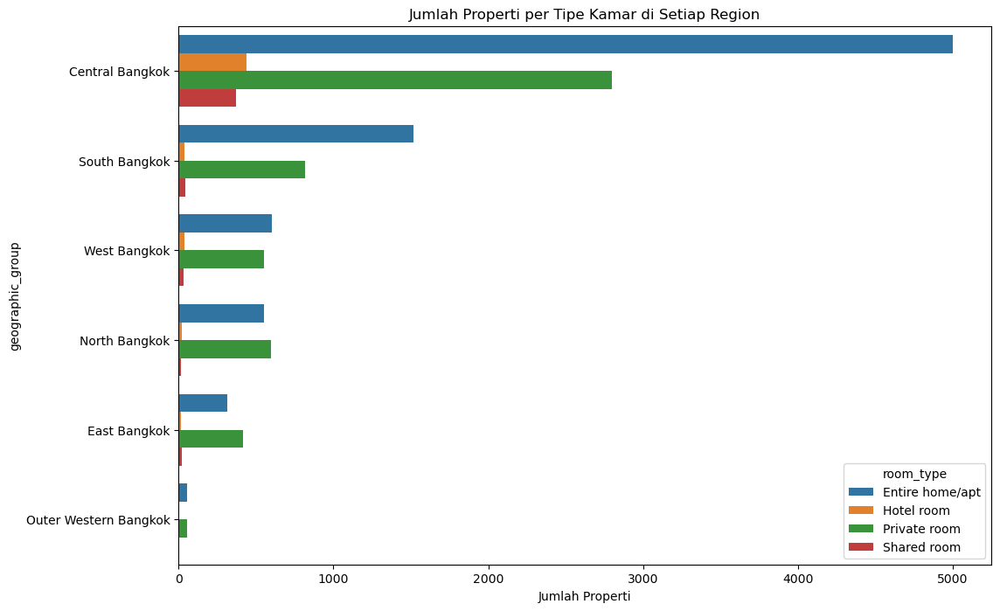

In [34]:
# Menambahkan kolom total untuk mengurutkan data
room_counts['Total'] = room_counts.sum(axis=1)

# Mengurutkan data berdasarkan total dalam urutan descending
room_counts = room_counts.sort_values(by='Total', ascending=False)

# Menghapus kolom total setelah pengurutan
room_counts.drop('Total', axis=1, inplace=True)

# Melebur (melt) DataFrame agar sesuai format untuk seaborn.barplot
melted_room_counts = room_counts.reset_index().melt(id_vars='geographic_group', value_name='count', var_name='room_type')

# Visualisasi
plt.figure(figsize=(12, 8))
sns.barplot(x='count', y='geographic_group', hue='room_type', data=melted_room_counts)
plt.title('Jumlah Properti per Tipe Kamar di Setiap Region')
plt.xlabel('Jumlah Properti')
plt.ylabel('geographic_group')
plt.show()

## Insight
- **'Entire home/apt'** menjadi pilihan utama di hampir semua wilayah, terutama di Central Bangkok, menunjukkan kecenderungan customeryang mengutamakan privasi, kelengkapan, dan kenyamanan.
- **Keterbatasan hotel room** terutama terlihat di beberapa wilayah seperti **Outer Western Bangkok**, menunjukkan potensi peluang bagi Airbnb untuk menawarkan alternatif akomodasi.
- Permintaan untuk **shared rooms** cenderung **rendah di semua wilayah**, mungkin karena **kurangnya minat atau permintaan untuk akomodasi bersama.**

## 3. Bagaimana tingkat aktivitas listing di Airbnb dipengaruhi oleh frekuensi ulasan terbaru dan dampaknya?

In [53]:
import pandas as pd

# Membuat DataFrame baru dengan nama host_status
host_status = df.copy()

# Drop baris dengan nilai null pada kolom 'last_review'
host_status.dropna(subset=['last_review'], inplace=True)

# Tahun terakhir dalam dataset
last_year_in_dataset = 2022

# Hitung selisih waktu antara tahun terakhir dalam dataset dan 'last_review' dalam tahun
host_status['years_since_last_review'] = (last_year_in_dataset - host_status['last_review'].dt.year)

# Fungsi untuk menggolongkan ke dalam kategori aktivitas
def classify_activity(years):
    if years > 1:
        return 'inactive'
    else:
        return 'active'

# Terapkan fungsi klasifikasi pada kolom 'years_since_last_review' dan simpan hasilnya di kolom baru 'activity_status'
host_status['activity_status'] = host_status['years_since_last_review'].apply(classify_activity)

host_status.head(5)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,geographic_group,years_since_last_review,activity_status,popularity
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,Central Bangkok,2,inactive,Low
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1,Central Bangkok,0,active,Low
5,1704776,NEw Pro!! Bungalow Bkk Centre,2129668,Wimonpak,Bang Kho laen,13.69757,100.52880,Entire home/apt,1000,250,19,2017-08-03,0.17,41,365,0,South Bangkok,5,inactive,Low
6,48736,Condo with Chaopraya River View,222005,Athitaya,Rat Burana,13.68556,100.49535,Private room,1558,3,1,2014-02-03,0.01,1,365,0,South Bangkok,8,inactive,Low
8,1744248,"Batcave, Pool view, near Chatuchak",9181769,Nol,Chatu Chak,13.81693,100.56433,Entire home/apt,1558,3,10,2016-03-29,0.09,1,365,0,North Bangkok,6,inactive,Low


In [91]:
# Ambil keseluruhan unique latitude dan longitude
unique_locations = host_status[['latitude', 'longitude']].drop_duplicates()

# Hitung jumlah data untuk setiap kategori aktivitas
activity_counts = host_status['activity_status'].value_counts()
pd.DataFrame(activity_counts)

,count
activity_status,
active,6279
inactive,2917


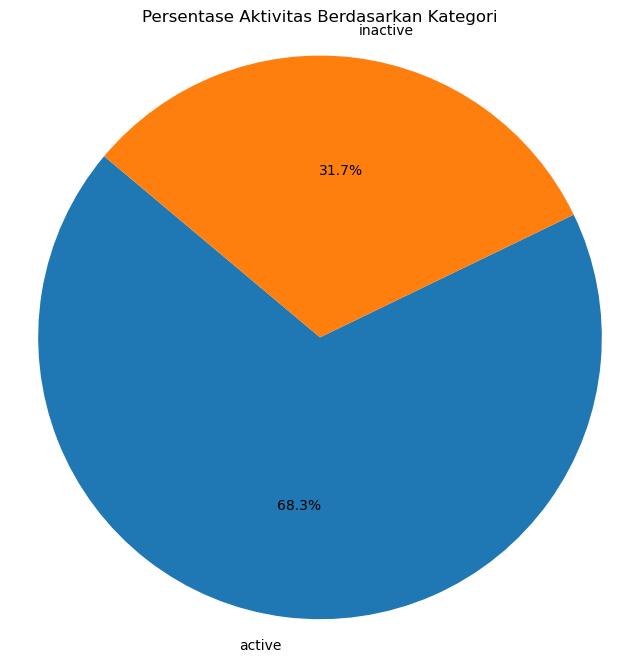

In [37]:
# Buat pie plot
plt.figure(figsize=(8, 8))
plt.pie(activity_counts, labels=activity_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Persentase Aktivitas Berdasarkan Kategori')
plt.axis('equal')  
plt.show()

## Insight:
- **Pentingnya Ulasan Terbaru dan indikasi Host Churn:** Persentase sebesar 31.7% dari listings tergolong sebagai inactive karena tidak mendapatkan ulasan dalam lebih dari satu tahun terakhir. Hal ini menunjukkan bahwa sejumlah besar properti mungkin kehilangan relevansi atau daya tarik mereka di pasar. Persentase inactive tersebut juga dapat mengindikasikan kepindahan host pada kompetitor, yang dapat diteliti lebih lanjut oleh tim Airbnb.

- **Dinamika dan Pergerakan Pasar:** Listings yang aktif, yaitu mereka yang menerima ulasan baru-baru ini, menunjukkan keterlibatan yang lebih baik dengan pelanggan dan potensi pendapatan yang lebih tinggi. Faktor ini berperan besar dalam kesuksesan berkelanjutan di platform Airbnb.

## 4. Bagaimana distribusi popularitas properti Airbnb di Bangkok berdasarkan jumlah ulasan 12 bulan terakhir (number_of_reviews_ltm) dan wilayah geografisnya?

In [38]:
# Menghitung nilai-nilai yang diperlukan untuk binning
min_reviews = df['number_of_reviews_ltm'].min()
max_reviews = df['number_of_reviews_ltm'].max()
range_reviews = max_reviews - min_reviews

# Menentukan batas-batas bin
bin_size = range_reviews / 3
low_threshold = min_reviews + bin_size
medium_threshold = min_reviews + (2 * bin_size)

# Fungsi untuk mengklasifikasikan popularitas berdasarkan bin
def classify_popularity(reviews):
    if reviews < low_threshold:
        return 'Low'
    elif low_threshold <= reviews < medium_threshold:
        return 'Medium'
    else:
        return 'High'

# Mengaplikasikan fungsi klasifikasi popularitas
df['popularity'] = df['number_of_reviews_ltm'].apply(classify_popularity)

# Mencari popularitas yang dominan untuk setiap geographic_group
dominant_popularity = df.groupby('geographic_group').apply(
    lambda x: x.loc[x['number_of_reviews_ltm'].idxmax()]
)

# Menampilkan DataFrame yang telah diklasifikasi
print("DataFrame dengan Klasifikasi Popularitas berdasarkan geographic_group:")
pd.DataFrame(dominant_popularity[['number_of_reviews_ltm', 'popularity']])

DataFrame dengan Klasifikasi Popularitas berdasarkan geographic_group:


C:\Users\grega\AppData\Local\Temp\ipykernel_34896\374939132.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['popularity'] = df['number_of_reviews_ltm'].apply(classify_popularity)


,number_of_reviews_ltm,popularity
geographic_group,,
Central Bangkok,325,High
East Bangkok,147,Medium
North Bangkok,62,Low
Outer Western Bangkok,29,Low
South Bangkok,246,High
West Bangkok,72,Low


In [59]:
pd.DataFrame(popular)

,number_of_reviews_ltm,popularity,geographic_group
geographic_group,,,
Central Bangkok,325,High,Central Bangkok
South Bangkok,246,High,South Bangkok
East Bangkok,147,Medium,East Bangkok
West Bangkok,72,Low,West Bangkok
North Bangkok,62,Low,North Bangkok
Outer Western Bangkok,29,Low,Outer Western Bangkok


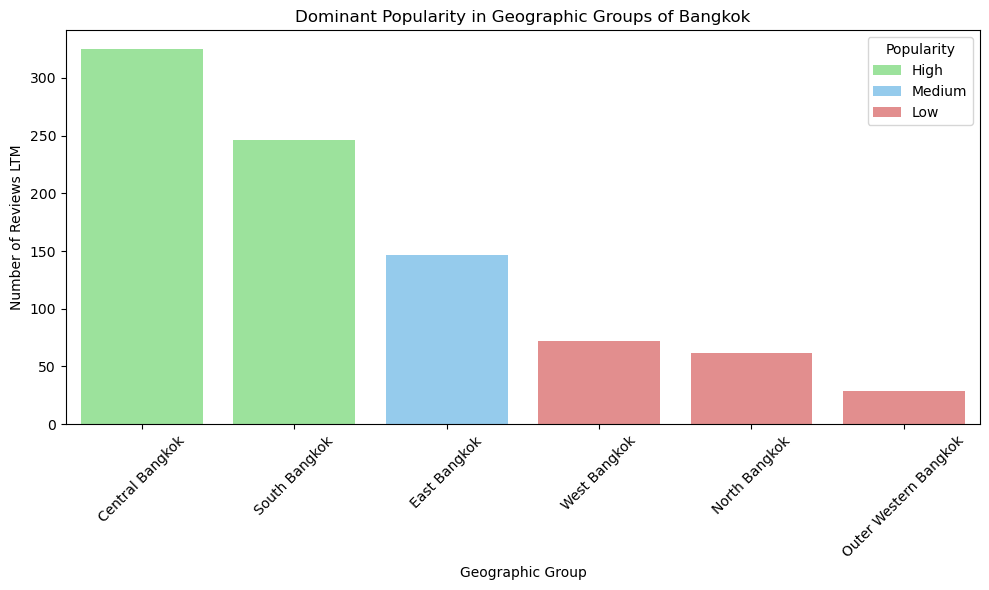

In [39]:
# Mengatur warna untuk setiap kategori popularitas
palette_colors = {'Low': 'lightcoral', 'Medium': 'lightskyblue', 'High': 'lightgreen'}

# Mengurutkan DataFrame berdasarkan 'number_of_reviews_ltm' secara descending
dominant_popularity = dominant_popularity.sort_values(by='number_of_reviews_ltm', ascending=False)

# Visualisasi menggunakan Bar Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=dominant_popularity['geographic_group'], y=dominant_popularity['number_of_reviews_ltm'], hue=dominant_popularity['popularity'], palette=palette_colors)
plt.title('Dominant Popularity in Geographic Groups of Bangkok')
plt.xlabel('Geographic Group')
plt.ylabel('Number of Reviews LTM')
plt.xticks(rotation=45)
plt.legend(title='Popularity')
plt.tight_layout()
plt.show()

In [49]:
import folium
from folium.plugins import MarkerCluster

# Membuat peta dengan koordinat pusat Bangkok
map_bangkok = folium.Map(location=[13.7563, 100.5018], zoom_start=11)

# Membuat cluster marker
marker_cluster = MarkerCluster().add_to(map_bangkok)

# Iterasi setiap baris DataFrame
for index, row in df.iterrows():
    # Menentukan warna marker berdasarkan tingkat popularitas
    if row['popularity'] == 'Low':
        color = 'red'
    elif row['popularity'] == 'Medium':
        color = 'orange'
    else:
        color = 'green'
    
    # Menambahkan marker pada peta
    folium.Marker(location=[row['latitude'], row['longitude']], 
                  popup=row['name'],
                  icon=folium.Icon(color=color, icon='info-sign')
                 ).add_to(marker_cluster)

# Menampilkan peta
map_bangkok

## Insight:

- Wilayah **South dan Central Bangkok memiliki popularitas tinggi**, dengan mayoritas properti mendapatkan jumlah ulasan yang tinggi (High).
- **East Bangkok memiliki popularitas menengah**, dimana sebagian besar properti mendapatkan jumlah ulasan yang sedang (Medium).
- **North Bangkok, Outer Western Bangkok, dan West Bangkok memiliki popularitas yang lebih rendah**, dengan mayoritas properti mendapatkan jumlah ulasan yang rendah (Low).

## Kesimpulan:
1. Jumlah ulasan yang tinggi berkorelasi positif dengan harga sewa, menunjukkan pentingnya reputasi dalam menentukan nilai sebuah listing. Jumlah ulasan tidak hanya mencerminkan kualitas layanan tetapi juga mengindikasikan popularitas dan traffic yang baik, karena jumlah pemberi ulasan merupakan representasi dari kumpulan pelanggan yang telah bertransaksi dan menempati listing tersebut.

2. Distribusi tipe kamar di Bangkok menunjukkan dominasi tipe Entire home/apt, terutama di Central Bangkok dengan 5002 unit. Sebaliknya, tipe Hotel room sangat rendah, terutama di Outer Western Bangkok yang tidak memiliki unit sama sekali. South dan North Bangkok menampilkan diversifikasi tipe kamar yang lebih banyak, sementara Shared Rooms umumnya tidak populer di semua wilayah.

3. Ke-aktifan listing menunjukkan bahwa 31.7% listing tidak mendapatkan ulasan lebih dari satu tahun, menandakan penurunan relevansi dan mungkin ketertarikan pasar. Sebaliknya, listing yang mendapatkan ulasan terbaru menunjukkan tingkat keterlibatan yang tinggi dan potensi pendapatan yang lebih baik. yang menegaskan pentingnya menjaga keterlibatan pelanggan untuk kesuksesan berkelanjutan di platform Airbnb.

4. Popularitas berdasarkan lokasi menunjukkan bahwa Central dan South Bangkok memiliki popularitas yang tinggi dengan banyak ulasan positif, menjadikannya tujuan favorit bagi banyak penyewa. East Bangkok memiliki popularitas sedang, sementara North, Outer Western, dan West Bangkok memiliki popularitas rendah, menunjukkan kebutuhan untuk peningkatan layanan dan promosi lebih lanjut di wilayah tersebut.

## Rekomendasi:

1. **Apa saja faktor/variabel yang mempengaruhi rata-rata harga berdasarkan tipe kamar?**
- Untuk meningkatkan harga sewa properti Airbnb, host dapat fokus pada pelayanan yang maksimal dan pengalaman yang memuaskan bagi tamu. Hal ini dapat mencakup memberikan fasilitas yang berkualitas, responsif terhadap kebutuhan tamu, serta menjaga kebersihan dan kenyamanan properti, sehingga memberikan kesan positif kepada tamu, dan tamu lebih berpotensi dan tertarik untuk memberikan review.
- Selain itu, host juga dapat mendorong tamu untuk memberikan ulasan setelah menginap dengan memberikan pengalaman yang positif dan memastikan bahwa semua kebutuhan mereka terpenuhi. Dengan demikian, jumlah ulasan yang positif dapat meningkatkan reputasi properti dan secara langsung mempengaruhi harga sewa yang dapat ditetapkan oleh host.


2. **Bagaimana distribusi tipe kamar Airbnb di berbagai wilayah/zona geografis di Bangkok?**
- Investasi aset di Area yang Kurang: Di zona seperti Outer Western Bangkok, Airbnb bisa menggali potensi dengan meningkatkan jumlah kamar hotel atau menawarkan lebih banyak shared rooms sebagai opsi yang lebih terjangkau, menarik bagi pelancong dengan anggaran terbatas.
- Optimalkan Penawaran Entire Home/Apartment: Mengingat permintaan yang tinggi untuk 'Entire home/apt', Airbnb dapat bekerja dengan pemilik properti untuk memastikan lebih banyak penawaran dari tipe ini tersedia di semua zona, khususnya di East dan West Bangkok yang menunjukkan jumlah yang lebih rendah.
- Strategi Pemasaran Berbasis Zona: Menyesuaikan strategi pemasaran berdasarkan popularitas tipe kamar di setiap zona. Misalnya, memasarkan lebih intensif tipe 'Private room' di North dan South Bangkok, di mana mereka cukup populer.
- Eksplorasi Pasar untuk Hotel Room: Melakukan studi pasar lebih lanjut untuk memahami mengapa ada sedikit hotel room yang tersedia dan apakah ada peluang untuk mengembangkan segmen ini, terutama di zona dengan wisatawan bisnis atau tamu jangka pendek yang lebih banyak.

3. **Bagaimana tingkat aktivitas listing di Airbnb dipengaruhi oleh frekuensi ulasan terbaru, dan dampaknya?**
- Mendorong Ulasan: Airbnb bisa mendorong host untuk aktif meminta ulasan dari tamu setelah masa inap mereka untuk memastikan bahwa listing tetap aktif dan menarik. Ini bisa melalui pengingat email atau insentif bagi tamu yang meninggalkan ulasan.
- Analisis dan Intervensi untuk Listing Inactive: Menyelidiki lebih lanjut penyebab ketidakaktifan beberapa properti dan menyediakan strategi atau sumber daya kepada host untuk meningkatkan keterlibatan mereka. Airbnb dapat menawarkan workshop atau kursus online tentang cara meningkatkan pengalaman tamu dan visibilitas listing.
- Update dan Promosi Listing: Mendorong host untuk memperbarui foto, deskripsi, dan fasilitas listing mereka secara berkala untuk membuat tawaran mereka lebih menarik dan relevan dengan permintaan pasar saat ini.
- Program Loyaltas atau Insentif: Mengembangkan program loyalitas atau insentif untuk host yang konsisten mendapatkan ulasan positif dan menjaga status aktif mereka, dan memperkuat komitmen mereka terhadap platform, sehingga Airbnb dapat memperkuat posisi pasar dan meningkatkan pengalaman baik untuk tamu maupun host, sambil memastikan bahwa sebanyak mungkin listing tetap aktif dan menguntungkan.

4. **Bagaimana distribusi popularitas properti Airbnb di Bangkok berdasarkan jumlah ulasan 12 bulan terakhir (number_of_reviews_ltm) dan wilayah geografisnya?**
- Pemilik properti di wilayah Central Bangkok dan South Bangkok perlu mempertahankan kualitas pelayanan dan fasilitas mereka untuk mempertahankan popularitas tinggi mereka.
- Pemilik properti di wilayah East Bangkok dapat mencari cara untuk meningkatkan jumlah ulasan agar popularitas properti mereka dapat meningkat.
- Pemilik properti di wilayah North Bangkok, Outer Western Bangkok, dan West Bangkok dapat fokus pada meningkatkan kualitas dan nilai properti mereka untuk meningkatkan popularitas pada persaingan pasar yang tinggi.
- Tim Airbnb dapat membuat campaign marketing dengan mengutamakan wilayah dengan popularitas menengah kebawah.